# Image Segmentation

## Mount google drive

and prepare some output folders

In [43]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [44]:
! mkdir /content/drive/MyDrive/colab-outputs/img-segmentation/out

mkdir: cannot create directory ‘/content/drive/MyDrive/colab-outputs/img-segmentation/out’: File exists


## Download and unzip the data

In [45]:
# ! wget http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz

In [46]:
# ! mkdir drive/MyDrive/datasets/BSR_bsds500

In [47]:
# ! mv BSR_bsds500.tgz drive/MyDrive/datasets/BSR_bsds500

In [48]:
# ! tar -xvzf drive/MyDrive/datasets/BSR_bsds500/BSR_bsds500.tgz -C drive/MyDrive/datasets/BSR_bsds500

Data is unzipped and available at [This link](https://drive.google.com/drive/folders/1-27fqQjJBTlMxrIBzmKzgfhcXkv0rAJl)

Please add this a shortcut to your google drive under a folder called `datasets` to be able to run this notebook.

## Imports

In [49]:
import numpy              as np
import pandas as pd
import matplotlib.pyplot  as plt

import cv2
import os

from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics.cluster import contingency_matrix

from scipy.io import loadmat

## Constants

In [50]:
IN = '/content/drive/MyDrive/datasets/BSR_bsds500/BSR/BSDS500/data'
OUT = '/content/drive/MyDrive/colab-outputs/img-segmentation/out'

## Exploring Data

Folder tree
```
IN
|_Images
| |_val
| | |_ ....jpg
| | |_ Thumbs.db
| |_train
| | |_ ....jpg
| | |_ Thumbs.db
| |_test
|   |_ ....jpg
|   |_ Thumbs.db
|
|_groundTruth
  |_val
  | |_ ....mat
  |_train
  | |_ ....mat
  |_test
    |_ ....mat
```

(321, 481, 3)


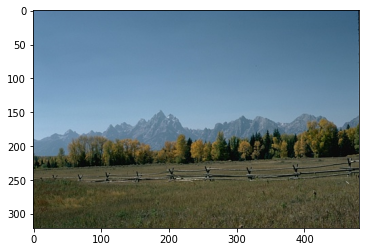

In [51]:
img = cv2.imread(f'{IN}/images/train/2092.jpg')
plt.imshow(img[:,:,::-1])

print(img.shape)
plt.show()

## Data loaders

In [52]:
def get_img_data(input_folder, subset = None):
  file_names = os.listdir(input_folder)
  images = []
  if subset == None:
    subset = len(file_names)
  for file in sorted(file_names)[:subset]:
    if file.split('.')[-1] != 'jpg':
      continue

    images.append(cv2.imread(f'{input_folder}/{file}'))
  return images

def get_ground_truth_data(input_folder, subset = None):
  file_names = os.listdir(input_folder)
  data = []
  if subset == None:
    subset = len(file_names)
  for file in sorted(file_names)[:subset]:
    if file.split('.')[-1] != 'mat':
      continue

    data.append(loadmat(f'{input_folder}/{file}'))
  return data

In [53]:
x_test = get_img_data(f'{IN}/images/test',subset = 50)
y_test = get_ground_truth_data(f'{IN}/groundTruth/test', subset = 50)

print("test samples: ",len(x_test), len(y_test))

test samples:  50 50


## Display image and ground truth

In [54]:
def disp_img_truth(img,truth,edges=True,gray=False):
  fig = plt.figure(figsize=(30,10))
  n = len(truth['groundTruth'][0])
  ax_img = fig.add_subplot(1,n+1,1)
  ax_img.imshow(img[:,:,::-1]) if not gray else ax_img.imshow(img)
  ax_img.axis('off')

  ax_gt = []
  for i,gt in enumerate(truth['groundTruth'][0]):
    ax_gt.append(fig.add_subplot(1,n+1,i+2))
    if edges:
      ground_truth = gt[0][0][1]
      ax_gt[-1].imshow(-1*ground_truth.astype(np.uint8),cmap='gray')
    else:
      ground_truth = gt[0][0][0]
      ax_gt[-1].imshow(ground_truth.astype(np.uint8))
    ax_gt[-1].axis('off')
    
  plt.show()

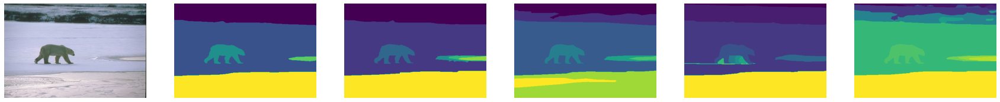

In [55]:
disp_img_truth(x_test[0],y_test[0],edges=False)

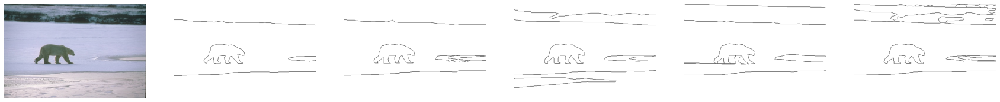

In [56]:
disp_img_truth(x_test[0],y_test[0],edges=True)

## Segmentation Using K-Means

In [57]:
def encode_position(img):
  img_indices = np.zeros((img.shape[:-1]+(5,)))
  img_indices[:,:,:3] = img

  row,col = np.indices((img.shape[:2]))
  img_indices[:,:,3] = row / img.shape[0] / 1.5
  img_indices[:,:,4] = col / img.shape[1] / 1.5

  return img_indices


In [58]:
class K_Means:
  def __init__(self,k=3):
    self.k = k
    self.centroids = None
    self.labels = None

  def fit(self,x_train, max_iter=100):
    # put the data in the right format
    if x_train.ndim != 2:
      x_train = x_train.reshape((-1,x_train.shape[-1]))

    # initialize the centroids
    self.centroids = np.random.choice(x_train.shape[0],self.k,replace=False)
    self.centroids = x_train[self.centroids]

    it = 0
    while it < max_iter:
      it += 1
      # calculate the distance between each point and each centroid
      dist = np.linalg.norm(x_train[:,np.newaxis]-self.centroids[np.newaxis],axis=-1)
      # assign each point to the closest centroid
      self.labels = np.argmin(dist,axis=-1)
      # calculate the new centroids
      new_centroids = np.zeros_like(self.centroids)
      for i in range(self.k):
        # calculate the mean of all points assigned to the centroid
        new_centroids[i] = np.mean(x_train[self.labels==i],axis=0)
      # check the stopping condition
      if np.all(new_centroids == self.centroids):
        break
      self.centroids = new_centroids

  def predict(self,x_test):
    # put the data in the right format
    if x_test.ndim != 2:
      x_test = x_test.reshape((-1,x_test.shape[-1]))

    # calculate the distance between each point and each centroid
    dist = np.linalg.norm(x_test[:,np.newaxis]-self.centroids[np.newaxis],axis=-1)
    # assign each point to the closest centroid
    return np.argmin(dist,axis=-1)


In [59]:
def k_means(k, img, position = False):
  fitted = K_Means(k)
  img = encode_position(img/255.) if position else (img / 255.)
  fitted.fit(img)
  labels = fitted.predict(img)

  return labels.reshape(img.shape[:2])

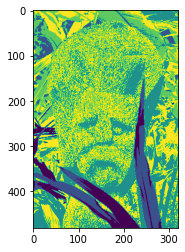

In [60]:
plt.imshow(k_means(5,x_test[5]))

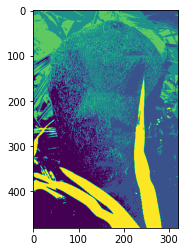

In [61]:
plt.imshow(k_means(5,x_test[5],position = True))

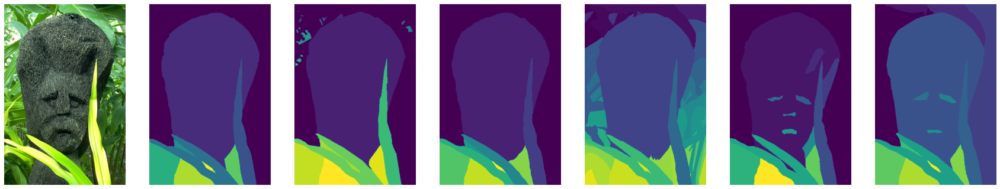

In [62]:
disp_img_truth(x_test[5],y_test[5],edges=False)

### Trying different Ks and saving as colored images

In [63]:
def get_all_labels(X, n = [3,5,7,9,11], position = False):
  y_pred = []
  for x in X:
    y = []
    for k in n:
      y.append(k_means(k,x,position = position))
    y_pred.append(y)
  return y_pred  

In [64]:
# y_pred = get_all_labels(x_test,position= True)

In [65]:
def save_all_labels(y_pred,dir):
  for i in range(len(y_pred)):
    path = f'{dir}/{i}'
    os.mkdir(path)
    for j,y in enumerate(y_pred[i]):
      y = 255. * y / max(np.max(y),1)
      cv2.imwrite(f'{path}/{j}.png',y)

  

In [66]:
# ! mkdir /content/drive/MyDrive/colab-outputs/img-segmentation/out/test/pos

In [67]:
# save_all_labels(y_pred, f'{OUT}/test/pos')

In [68]:
# np.save(f'{OUT}/test/pos/y_pred',np.array(y_pred,dtype=object))

In [69]:
y_pred = np.load(f'{OUT}/test/pos/y_pred.npy',allow_pickle=True)
y_pred[0].shape

(5,)

## Performing max-matching to assign correct labels to clusters

In [70]:
# (k clusters, i images, m ground truths, contingency shape)
def contingency(y_pred,y_true):
    contingency_matrices = np.zeros((len(y_pred[0]),len(y_pred),),dtype=object)
    for k in range(len(y_pred[0])):
    # for each k in [3,5,7,9,11]
        for i in range(len(y_pred)):
            # for each image i
            temp = np.zeros((len(y_true[i]['groundTruth'][0]),),dtype = object)
            for m, gt in enumerate(y_true[i]['groundTruth'][0]):
                # each image i has m ground truths
                ground_truth = gt[0][0][0]
                temp[m] = contingency_matrix(ground_truth, y_pred[i][k])
            contingency_matrices[k,i] = temp.copy()
            del temp
    return contingency_matrices

In [71]:
# con = contingency(y_pred,y_test)
# con[0,1][0]

In [72]:
def max_match_one_img(contingency, y_true,y_pred):
    y_new = y_pred.copy()
    true_unique = np.unique(y_true)
    pred_unique = np.unique(y_pred)
    mapping = np.zeros(pred_unique.shape+ (2,))
    for c in range(contingency.shape[-1]):
        best_match = np.argmax(contingency[:,c])
        y_new[y_pred == pred_unique[c]] = true_unique[best_match]
        mapping[c] = [pred_unique[c],true_unique[best_match]]
    return y_new, mapping

In [73]:
def max_match_all(contingencies,y_true,y_pred):
    y_pred_matched = np.zeros(y_pred.shape , dtype=object)
    for k in range(len(y_pred[0])):
    # for each k in [3,5,7,9,11]
        for i in range(len(y_pred)):
            # for each image i
            y_pred_matched[i,k] = np.zeros((len(y_true[i]['groundTruth'][0]),) + y_pred[i,k].shape)
            for m, gt in enumerate(y_true[i]['groundTruth'][0]):
                # each image i has m ground truths
                ground_truth = gt[0][0][0]
                contingency = contingencies[k,i][m]
                y_pred_matched[i,k][m] = max_match_one_img(contingency,ground_truth,y_pred[i,k])[0]
    return y_pred_matched

In [74]:
# y_pred_matched = max_match_all(con,y_test,y_pred)
# np.save(f'{OUT}/test/pos/y_pred_matched',y_pred_matched)
y_pred_matched = np.load(f'{OUT}/test/pos/y_pred_matched.npy',allow_pickle=True)

## Computing F-measure

In [75]:
def f_measure_all(y_true,y_pred):
    f_measure = np.zeros(y_pred.shape , dtype=object)
    avg = 0
    count = 0
    for k in range(len(y_pred[0])):
    # for each k in [3,5,7,9,11]
        for i in range(len(y_pred)):
            # for each image i
            f_measure[i,k] = np.zeros((len(y_true[i]['groundTruth'][0])+1,))
            for m, gt in enumerate(y_true[i]['groundTruth'][0]):
                # each image i has m ground truths
                ground_truth = gt[0][0][0]
                f_measure[i,k][m] = f1_score(ground_truth.reshape((-1,)),y_pred[i,k][m].reshape((-1,)),average='macro')
                avg = avg + f_measure[i,k][m]
                count = count + 1
            f_measure[i,k][-1] = np.mean(f_measure[i,k][:-1]) # average
    return f_measure, avg / count



In [76]:
# f_measure, avg = f_measure_all(y_test,y_pred_matched)
# np.save(f'{OUT}/test/pos/f_measure',np.array((f_measure,avg),dtype=object))
f_measure, avg = np.load(f'{OUT}/test/pos/f_measure.npy',allow_pickle=True)
avg

0.22349031491071655

## Computing conditional entropy

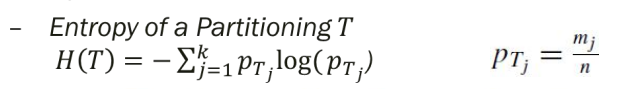

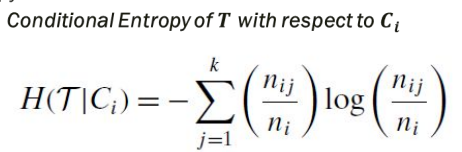

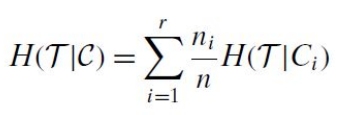

In [77]:
def conditional_entropy(y_true, y_pred):
    n = y_pred.shape[0]
    cond_ent = 0
    for c in np.unique(y_pred):
        # for each cluster c in clustering
        nc = (y_pred == c).shape[0]
        ent = 0
        for k in np.unique(y_true):
            # for each label in the cluster
            nkc = (y_true[y_pred == c] == k).shape[0]
            p = nkc / nc
            ent = ent + -1 * p * np.log(p)
        cond_ent = cond_ent + ent * nc / n
    return cond_ent

def conditional_entropy_all(y_true,y_pred):
    ent = np.zeros(y_pred.shape , dtype=object)
    avg = 0
    count = 0
    for k in range(len(y_pred[0])):
    # for each k in [3,5,7,9,11]
        for i in range(len(y_pred)):
            # for each image i
            ent[i,k] = np.zeros((len(y_true[i]['groundTruth'][0])+1,))
            for m, gt in enumerate(y_true[i]['groundTruth'][0]):
                # each image i has m ground truths
                ground_truth = gt[0][0][0]
                ent[i,k][m] = conditional_entropy(ground_truth.reshape((-1,)),y_pred[i,k][m].reshape((-1,)))
                avg = avg + ent[i,k][m]
                count = count + 1
            ent[i,k][-1] = np.mean(ent[i,k][:-1]) # average
    return ent, avg / count

In [78]:
# conditional_ent, avg = conditional_entropy_all(y_test,y_pred_matched)
# np.save(f'{OUT}/test/pos/conditional_entropy',np.array((conditional_ent,avg),dtype=object))
conditional_ent, avg = np.load(f'{OUT}/test/pos/conditional_entropy.npy',allow_pickle=True)
avg

23.09322681949724

We will evaluate the result segmentation using F-measure,
Conditional Entropy for image I with M available ground-truth
segmentations. For a clustering of K-clusters you will report your
measures M times and the average of the M trials as well.

Image: 20


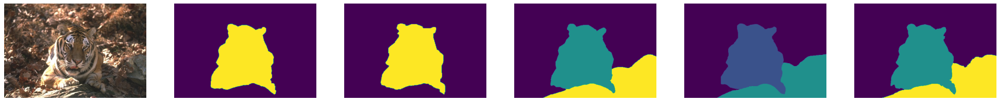

	 k = 0
	 	  m = 0
	 	 	 F-measure = 0.4348674289562684
	 	 	 Conditional Entropy = 0.0
	 	  m = 1
	 	 	 F-measure = 0.4348488120555046
	 	 	 Conditional Entropy = 0.0
	 	  m = 2
	 	 	 F-measure = 0.2525853098617235
	 	 	 Conditional Entropy = 0.0
	 	  m = 3
	 	 	 F-measure = 0.15021576914521445
	 	 	 Conditional Entropy = 0.0
	 	  m = 4
	 	 	 F-measure = 0.4284766412196494
	 	 	 Conditional Entropy = 2.0176769805662103
Average F-measure = 0.340198792247672
Average Conditional Entropy = 0.4035353961132421
	 k = 1
	 	  m = 0
	 	 	 F-measure = 0.4348674289562684
	 	 	 Conditional Entropy = 0.0
	 	  m = 1
	 	 	 F-measure = 0.4348488120555046
	 	 	 Conditional Entropy = 0.0
	 	  m = 2
	 	 	 F-measure = 0.6291311929128804
	 	 	 Conditional Entropy = 2.403090506846218
	 	  m = 3
	 	 	 F-measure = 0.3791047687736945
	 	 	 Conditional Entropy = 4.005150844743697
	 	  m = 4
	 	 	 F-measure = 0.6331449872703923
	 	 	 Conditional Entropy = 2.403090506846218
Average F-measure = 0.502219437993748
A

In [81]:
# Choosing I randomly
i = np.random.permutation(50)[0]
print(f"Image: {i}")

disp_img_truth(x_test[i],y_test[i],edges=False)

for k in range(len(y_pred[0])):
    # for each k in [3,5,7,9,11]
    print(f"\t k = {k}")
    for j in range(len(conditional_ent[i,k]) - 1):
        # each image i has m ground truths
        print(f"\t \t  m = {j}")
        print(f"\t \t \t F-measure = {f_measure[i,k][j]}")
        print(f"\t \t \t Conditional Entropy = {conditional_ent[i,k][j]}")
    print(f"Average F-measure = {f_measure[i,k][-1]}")
    print(f"Average Conditional Entropy = {conditional_ent[i,k][-1]}")


## Good and bad results

In [ ]:
def get_avg_per_img(metric):
    avg = np.zeros( (metric.shape[0], metric.shape[1]),dtype=np.float32)
    for ii, i in enumerate(metric):
        for ik, k in enumerate(i):
            avg[ii,ik] = k[-1]
    return avg
avg_f_measures = get_avg_per_img(f_measure)
avg_entropy = get_avg_per_img(conditional_ent)

In [ ]:
avg_f_measures, avg_entropy

(array([[0.18059273, 0.2771116 , 0.33175284, 0.3293833 , 0.45084506],
        [0.17958646, 0.3091027 , 0.3555887 , 0.34932023, 0.3699309 ],
        [0.43853486, 0.54151595, 0.5348212 , 0.5443254 , 0.5608779 ],
        [0.13200991, 0.16422804, 0.20625786, 0.21252185, 0.22649384],
        [0.1297009 , 0.18439293, 0.27399683, 0.27380753, 0.30565193],
        [0.07465418, 0.10368318, 0.14467335, 0.17228197, 0.19326453],
        [0.04096096, 0.0569514 , 0.05958315, 0.0684364 , 0.08323054],
        [0.21052143, 0.43546537, 0.4436726 , 0.45574597, 0.46307522],
        [0.16653335, 0.23280022, 0.3641327 , 0.37122405, 0.39011472],
        [0.12118946, 0.17727867, 0.20684002, 0.27245358, 0.29650033],
        [0.07726093, 0.15104038, 0.15392308, 0.16204488, 0.16405399],
        [0.12347353, 0.1726279 , 0.19328211, 0.2520385 , 0.25824907],
        [0.16909258, 0.25933674, 0.29365465, 0.28859985, 0.42709345],
        [0.3292219 , 0.38214904, 0.40451908, 0.48257157, 0.5337167 ],
        [0.34303796,

In [ ]:
f_measure_sorted = np.argsort(avg_f_measures,axis=0)
entropy_sorted = np.argsort(avg_entropy,axis=0)

best_and_worst_f = (np.take_along_axis(avg_f_measures,f_measure_sorted[-5:],axis=0) , np.take_along_axis(avg_f_measures,f_measure_sorted[:5],axis=0))

best_and_worst_ent = (np.take_along_axis(avg_entropy,entropy_sorted[:5],axis=0) , np.take_along_axis(avg_entropy,entropy_sorted[-5:],axis=0))

best_and_worst_ent, best_and_worst_f

((array([[0.       , 1.1037788, 2.3660069, 2.1605709, 2.1418297],
         [0.       , 1.2694029, 2.3814116, 2.502521 , 2.2496338],
         [0.4035354, 1.7622664, 3.3890636, 2.8416865, 4.1375346],
         [1.1043178, 2.2189517, 3.8717692, 3.922901 , 4.628664 ],
         [1.2158123, 2.562468 , 4.359214 , 4.02241  , 4.7969646]],
        dtype=float32),
  array([[34.18059 , 44.74947 , 45.254543, 53.189346, 58.98802 ],
         [35.161224, 45.727894, 47.816864, 59.87614 , 69.93748 ],
         [37.58074 , 49.978226, 58.61483 , 67.63068 , 71.94    ],
         [42.66935 , 65.45259 , 71.97309 , 85.499855, 86.67983 ],
         [50.81515 , 69.94575 , 79.16351 , 88.32618 , 90.325134]],
        dtype=float32)),
 (array([[0.35515004, 0.43546537, 0.50527704, 0.5443254 , 0.5337167 ],
         [0.35808912, 0.4449299 , 0.5348212 , 0.54897356, 0.55178916],
         [0.37761924, 0.50221944, 0.55649817, 0.5526192 , 0.5608779 ],
         [0.38528737, 0.54151595, 0.5637381 , 0.5594958 , 0.592158  ],
     

In [ ]:
def disp_all_k(y_pred):
    n = len(y_pred)
    fig = plt.figure(figsize=(30,10))
    for i in range(n):
        ax = fig.add_subplot(1,n,i+1)
        ax.imshow(y_pred[i])


### Best entropy at k = 3

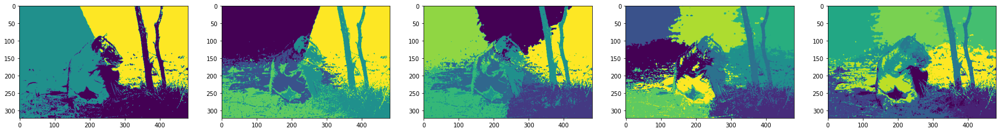

In [ ]:
disp_all_k(y_pred[entropy_sorted[0,0]])

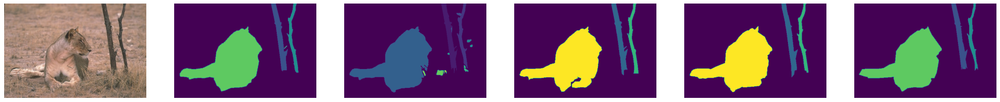

In [ ]:
disp_img_truth(x_test[entropy_sorted[0,0]],y_test[entropy_sorted[0,0]],edges=False)

### Best entropy at k = 5

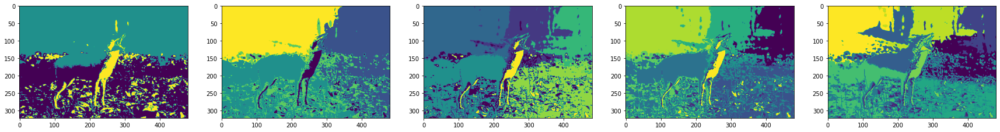

In [ ]:
disp_all_k(y_pred[entropy_sorted[0,1]])

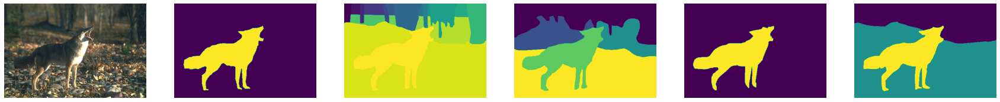

In [ ]:
disp_img_truth(x_test[entropy_sorted[0,1]],y_test[entropy_sorted[0,1]],edges=False)

### Best entropy at k = 7

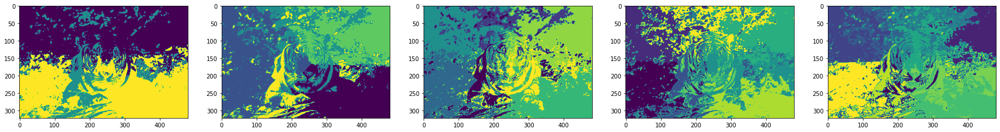

In [ ]:
disp_all_k(y_pred[entropy_sorted[0,2]])

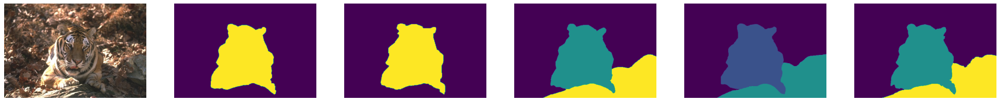

In [ ]:
disp_img_truth(x_test[entropy_sorted[0,2]],y_test[entropy_sorted[0,2]],edges=False)

### Best entropy at k = 9

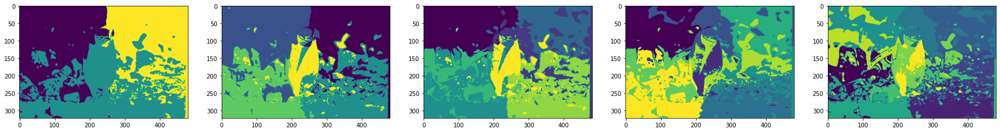

In [ ]:
disp_all_k(y_pred[entropy_sorted[0,3]])

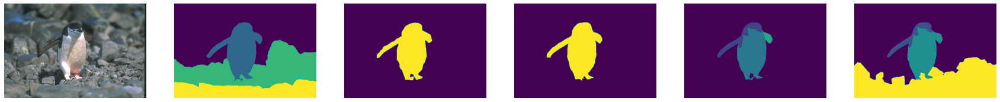

In [ ]:
disp_img_truth(x_test[entropy_sorted[0,3]],y_test[entropy_sorted[0,3]],edges=False)

### Best entropy at k = 11

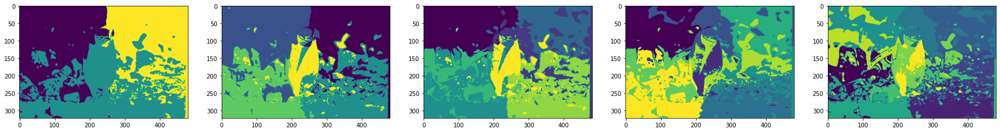

In [ ]:
disp_all_k(y_pred[entropy_sorted[0,4]])

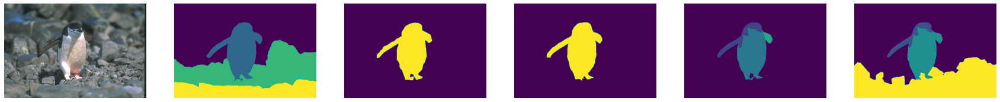

In [ ]:
disp_img_truth(x_test[entropy_sorted[0,4]],y_test[entropy_sorted[0,4]],edges=False)

### Best F-measure at k = 3

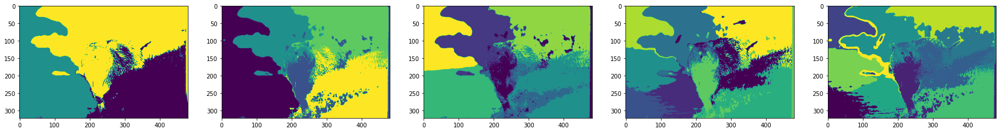

In [ ]:
disp_all_k(y_pred[f_measure_sorted[-1,0]])

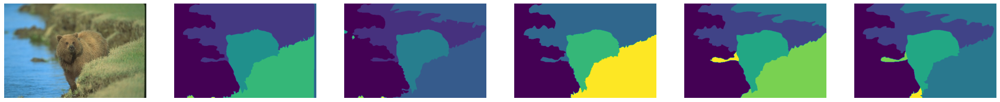

In [ ]:
disp_img_truth(x_test[f_measure_sorted[-1,0]],y_test[f_measure_sorted[-1,0]],edges=False)

### Best F-measure at k = 5

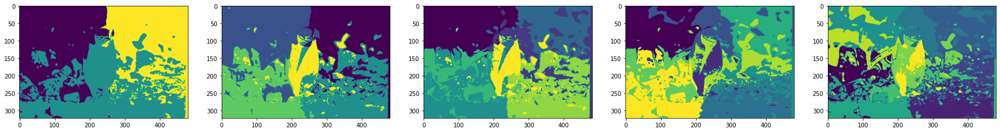

In [ ]:
disp_all_k(y_pred[f_measure_sorted[-1,1]])

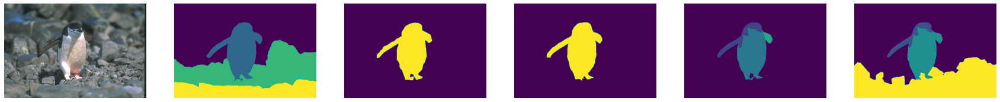

In [ ]:
disp_img_truth(x_test[f_measure_sorted[-1,1]],y_test[f_measure_sorted[-1,1]],edges=False)

### Best F-measure at k = 7

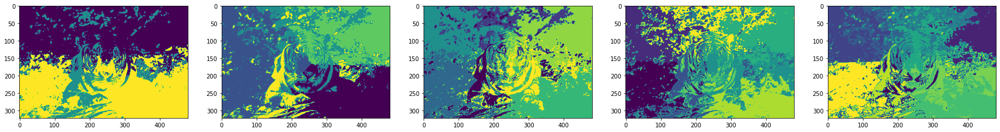

In [ ]:
disp_all_k(y_pred[f_measure_sorted[-1,2]])

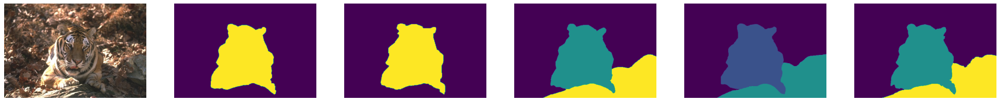

In [ ]:
disp_img_truth(x_test[f_measure_sorted[-1,2]],y_test[f_measure_sorted[-1,2]],edges=False)

### Best F-measure at k = 9

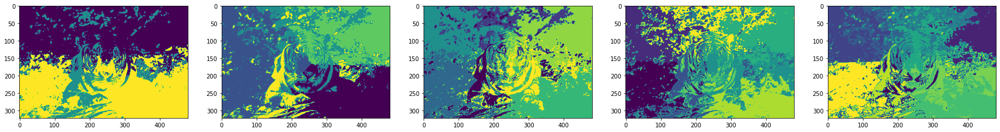

In [ ]:
disp_all_k(y_pred[f_measure_sorted[-1,3]])

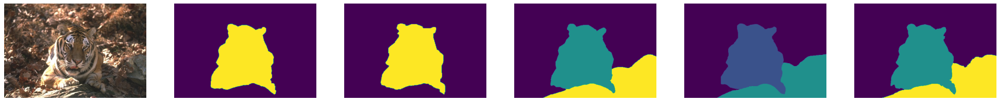

In [ ]:
disp_img_truth(x_test[f_measure_sorted[-1,3]],y_test[f_measure_sorted[-1,3]],edges=False)

### Best F-measure at k = 11

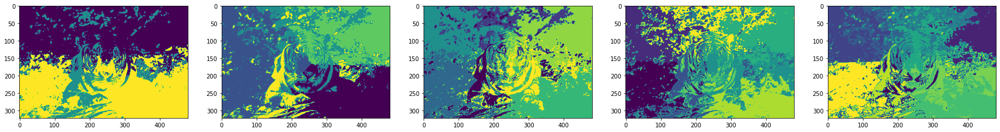

In [ ]:
disp_all_k(y_pred[f_measure_sorted[-1,4]])

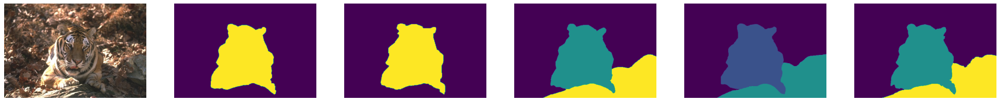

In [ ]:
disp_img_truth(x_test[f_measure_sorted[-1,4]],y_test[f_measure_sorted[-1,4]],edges=False)

### Worst entropy at k = 3

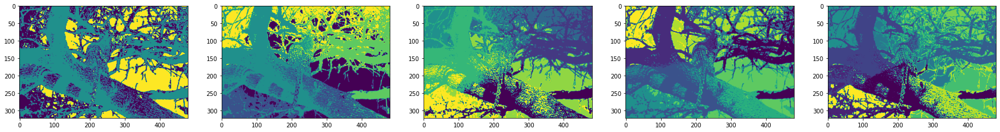

In [ ]:
disp_all_k(y_pred[entropy_sorted[-1,0]])

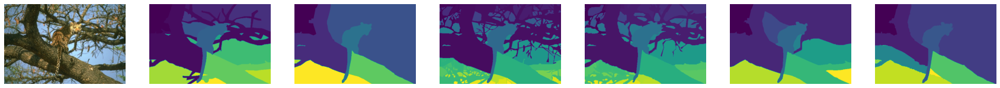

In [ ]:
disp_img_truth(x_test[entropy_sorted[-1,0]],y_test[entropy_sorted[-1,0]],edges=False)

### Worst entropy at k = 5

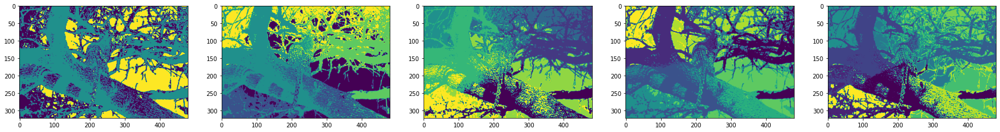

In [ ]:
disp_all_k(y_pred[entropy_sorted[-1,1]])

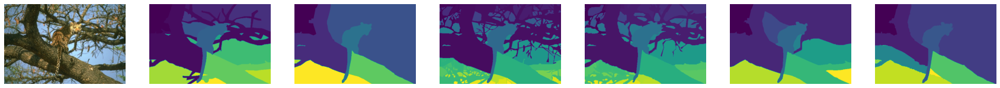

In [ ]:
disp_img_truth(x_test[entropy_sorted[-1,1]],y_test[entropy_sorted[-1,1]],edges=False)


### Worst entropy at k = 7

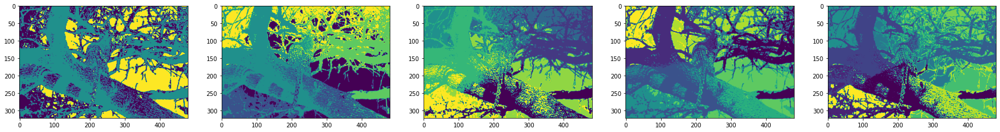

In [ ]:
disp_all_k(y_pred[entropy_sorted[-1,2]])

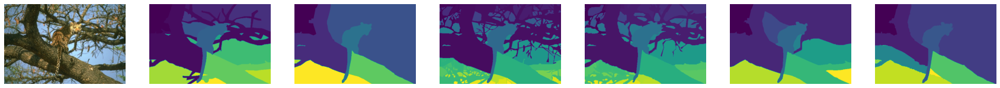

In [ ]:
disp_img_truth(x_test[entropy_sorted[-1,2]],y_test[entropy_sorted[-1,2]],edges=False)

### Worst entropy at k = 9

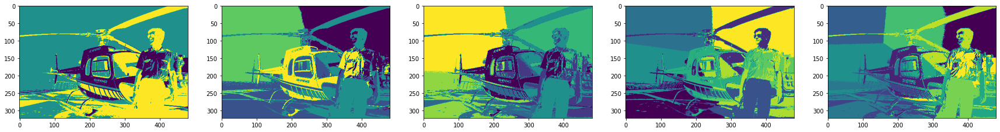

In [ ]:
disp_all_k(y_pred[entropy_sorted[-1,3]])

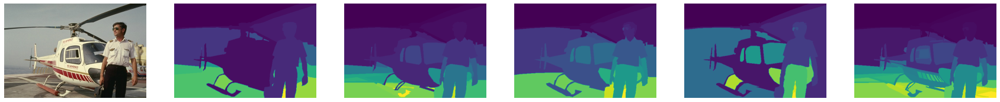

In [ ]:
disp_img_truth(x_test[entropy_sorted[-1,3]],y_test[entropy_sorted[-1,3]],edges=False)

### Worst entropy at k = 11

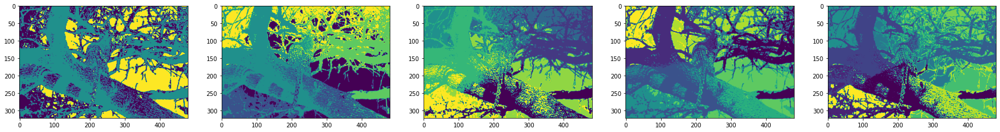

In [ ]:
disp_all_k(y_pred[entropy_sorted[-1,4]])

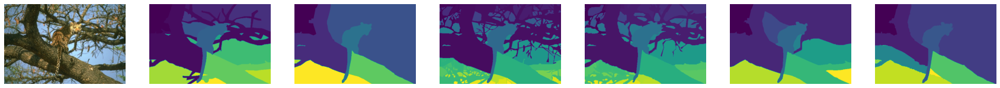

In [ ]:
disp_img_truth(x_test[entropy_sorted[-1,4]],y_test[entropy_sorted[-1,4]],edges=False)

### Worst F-measure at k = 3

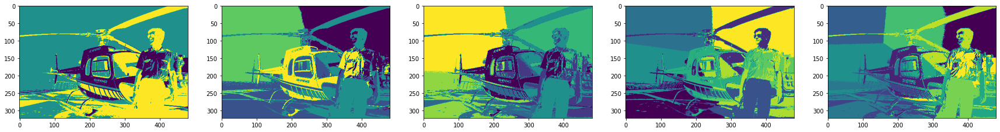

In [ ]:
disp_all_k(y_pred[f_measure_sorted[0,0]])

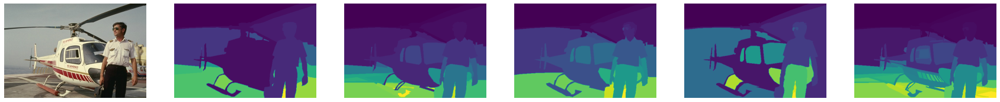

In [ ]:
disp_img_truth(x_test[f_measure_sorted[0,0]],y_test[f_measure_sorted[0,0]],edges=False)

### Worst F-measure at k = 5

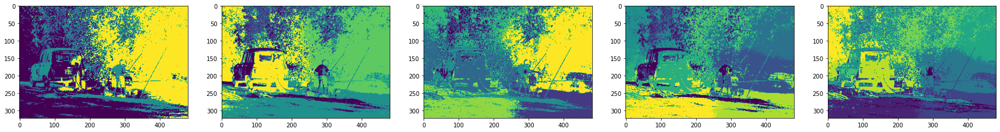

In [ ]:
disp_all_k(y_pred[f_measure_sorted[0,1]])

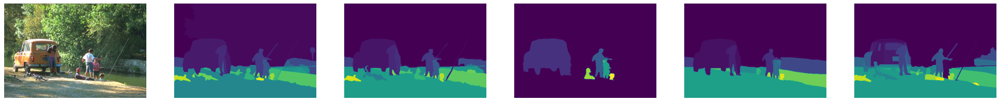

In [ ]:
disp_img_truth(x_test[f_measure_sorted[0,1]],y_test[f_measure_sorted[0,1]],edges=False)

### Worst F-measure at k = 7

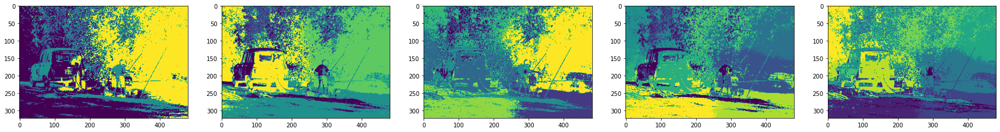

In [ ]:
disp_all_k(y_pred[f_measure_sorted[0,2]])

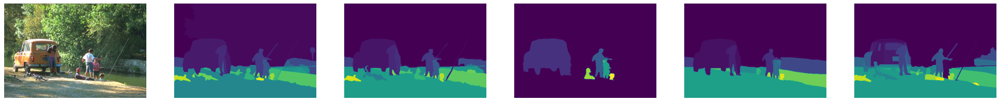

In [ ]:
disp_img_truth(x_test[f_measure_sorted[0,2]],y_test[f_measure_sorted[0,2]],edges=False)

### Worst F-measure at k = 9

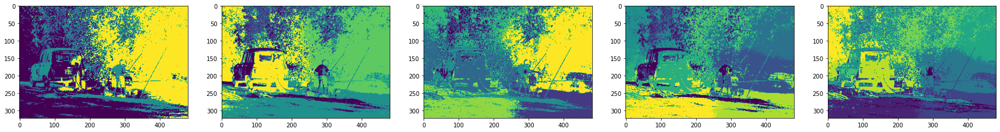

In [ ]:
disp_all_k(y_pred[f_measure_sorted[0,3]])

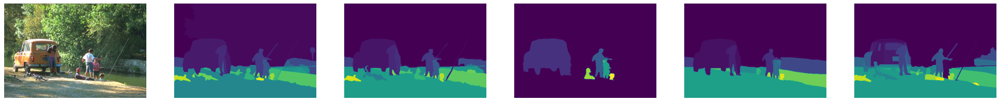

In [ ]:
disp_img_truth(x_test[f_measure_sorted[0,3]],y_test[f_measure_sorted[0,3]],edges=False)

### Worst F-measure at k = 11

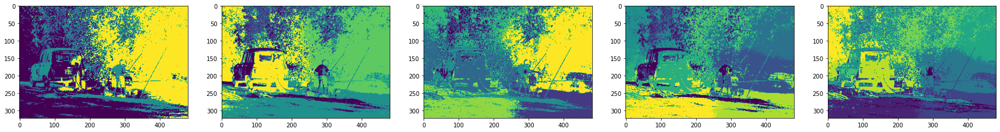

In [ ]:
disp_all_k(y_pred[f_measure_sorted[0,4]])

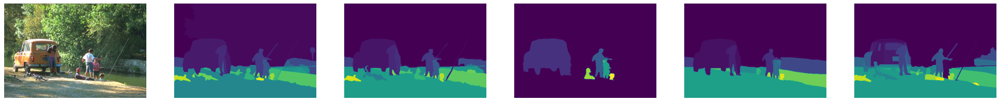

In [ ]:
disp_img_truth(x_test[f_measure_sorted[0,4]],y_test[f_measure_sorted[0,4]],edges=False)